# PIPELINE: model 4, dataset v2(https://app.roboflow.com/sidsproject/back_stomach_2-used-pehn2-8iy1j/generate/preprocessing), different types of embeddings

## PIPELINE
### 1. load model face_detection
### 2. extract embeddings from dataset
### 3. retrieval to evaluate embeddings goodness
### 4. train model classification

## 1. load the model face_detection
Step 1 is the same for each pipeline, so we do it once at the beginning.

**Import dependencies**

In [1]:
%load_ext autoreload
%autoreload 2

from libraries.embeddings_utils import *
import os
import ipynbname

from libraries.retrieval_utils import *
from libraries.classifier_utils import *
from libraries.file_manager_utils import *

project_dir = f"{os.getcwd().split('SIDS_revelation_project')[0]}SIDS_revelation_project"
image_dataset_path = f"{project_dir}/datasets/onback_onstomach_v2"

model_path = f"{project_dir}/models/4.weights/best.pt"

**Choose how to process the dataset:**
1. "extract_features":                     extracting features and labels
2. "extract_features_imageswithinference": extracting features and labels and saving predicted images with bboxes
3. "load":                                  loading features and labels

In [2]:
emb_builder = EmbeddingBuilder(model_path, image_dataset_path, "load")


Extracting dataset info from .coco.json file:---------------------------------------------
Dataset contains 1506 valid samples, and labels are {'baby_on_back': 1, 'baby_on_stomach': 2}
------------------------------------------------------------------------------------------

Loading features from .csv----------------------------------------------------------------
Features loaded succesfully, in particular there are 1506 files in the dataset
------------------------------------------------------------------------------------------

Embedding builder initialized successfully------------------------------------------------
Face detection model: 4 (YOLOv8)
Dataset: /Users/lorenzodimaio/Download/SIDS_revelation_project/datasets/onback_onstomach_v2
Dataset dimension: 1506
Dataset labels: {'baby_safe': 0, 'baby_unsafe': 1}
------------------------------------------------------------------------------------------


---
# EMBEDDING flag

---

## 2. Extract embeddings from dataset

**Create embeddings**

In [3]:
embeddings = emb_builder.create_embedding(flags=True)


Embedding creation------------------------------------------------------------------------
Features: ['flag_eye1', 'flag_eye2', 'flag_nose', 'flag_mouth']
FINISHED: 1506 embedding created
------------------------------------------------------------------------------------------


In [4]:
embeddings.head()

,flag_eye1,flag_eye2,flag_nose,flag_mouth
0,0,0,0,0
1,1,1,1,1
2,0,0,0,0
3,1,1,1,1
4,1,1,1,1


## 3. Retrieval to evaluate embedding goodness

Precision at different k:-----------------------------------------------------------------


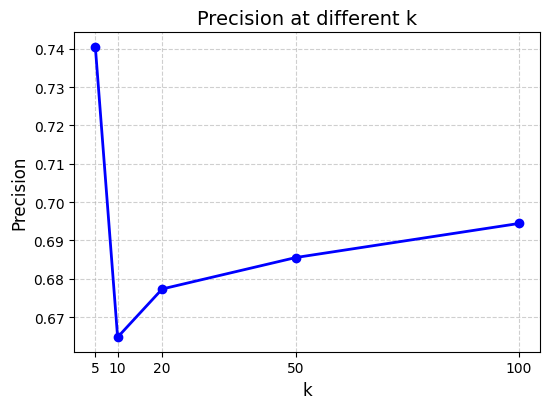


Recall at R-------------------------------------------------------------------------------
0.6558580010669358

Silhouette score--------------------------------------------------------------------------

Embeddings distributions------------------------------------------------------------------


/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/discriminant_analysis.py:756: RuntimeWarning: divide by zero encountered in matmul
  X_new = (X - self.xbar_) @ self.scalings_
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/discriminant_analysis.py:756: RuntimeWarning: overflow encountered in matmul
  X_new = (X - self.xbar_) @ self.scalings_
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/discriminant_analysis.py:756: RuntimeWarning: invalid value encountered in matmul
  X_new = (X - self.xbar_) @ self.scalings_


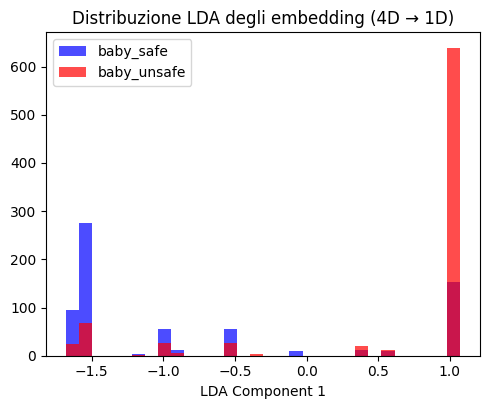

/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/utils/extmath.py:350: RuntimeWarning: divide by zero encountered in matmul
  Q, _ = normalizer(A @ Q)
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/utils/extmath.py:350: RuntimeWarning: overflow encountered in matmul
  Q, _ = normalizer(A @ Q)
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/utils/extmath.py:350: RuntimeWarning: invalid value encountered in matmul
  Q, _ = normalizer(A @ Q)
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/utils/extmath.py:351: RuntimeWarning: divide by zero encountered in matmul
  Q, _ = normalizer(A.T @ Q)
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/utils/extmath.py:351: RuntimeWarning: overflow encountered in matmul
  Q, _ = normalizer(A.T @ Q)
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/utils/extmath.py:351: RuntimeWarning: invalid value encountered in matmul
  Q, _ = normaliz

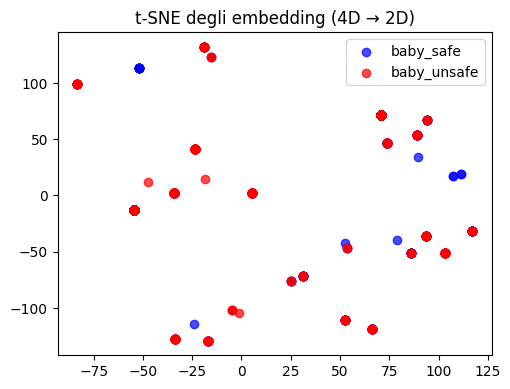

/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


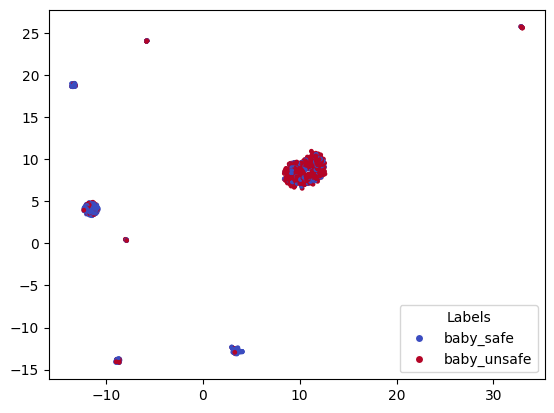

In [5]:
ret = ImageRetrieval(embeddings, emb_builder.y, emb_builder.image_paths, image_dataset_path, emb_builder.classes_bs)
ret.report("euclidean")

Precision at different k:-----------------------------------------------------------------


/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/util

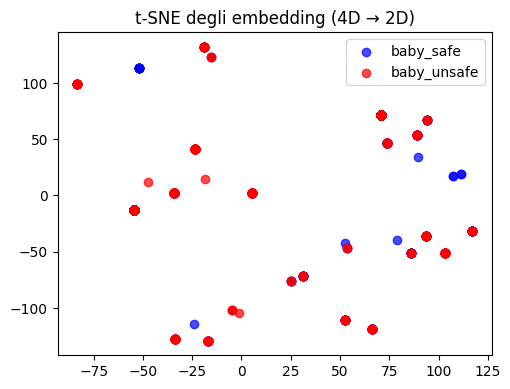

/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


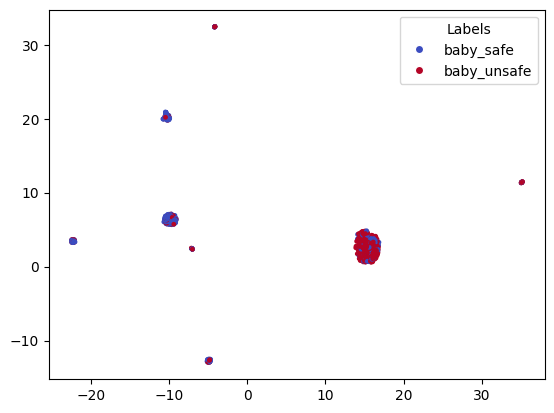

In [6]:
ret.report("cosine")

Precision at different k:-----------------------------------------------------------------


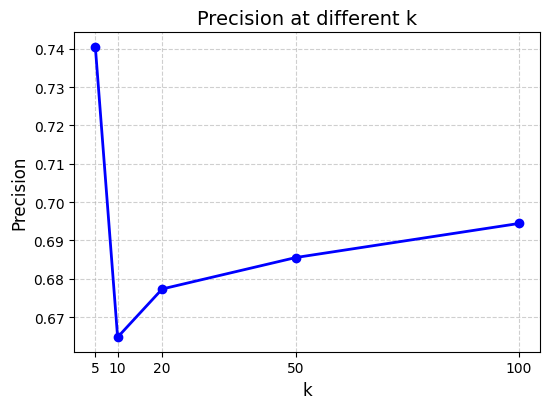


Recall at R-------------------------------------------------------------------------------
0.6558580010669358

Silhouette score--------------------------------------------------------------------------

Embeddings distributions------------------------------------------------------------------


/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/discriminant_analysis.py:756: RuntimeWarning: divide by zero encountered in matmul
  X_new = (X - self.xbar_) @ self.scalings_
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/discriminant_analysis.py:756: RuntimeWarning: overflow encountered in matmul
  X_new = (X - self.xbar_) @ self.scalings_
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/discriminant_analysis.py:756: RuntimeWarning: invalid value encountered in matmul
  X_new = (X - self.xbar_) @ self.scalings_


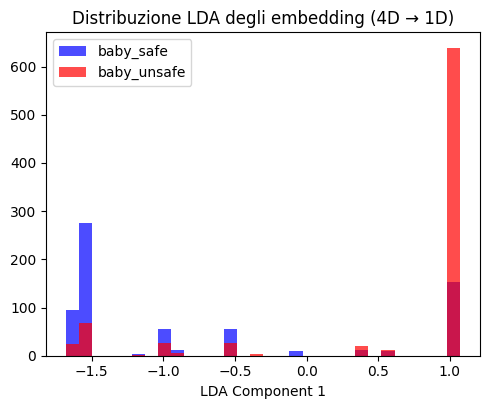

/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/utils/extmath.py:350: RuntimeWarning: divide by zero encountered in matmul
  Q, _ = normalizer(A @ Q)
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/utils/extmath.py:350: RuntimeWarning: overflow encountered in matmul
  Q, _ = normalizer(A @ Q)
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/utils/extmath.py:350: RuntimeWarning: invalid value encountered in matmul
  Q, _ = normalizer(A @ Q)
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/utils/extmath.py:351: RuntimeWarning: divide by zero encountered in matmul
  Q, _ = normalizer(A.T @ Q)
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/utils/extmath.py:351: RuntimeWarning: overflow encountered in matmul
  Q, _ = normalizer(A.T @ Q)
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/utils/extmath.py:351: RuntimeWarning: invalid value encountered in matmul
  Q, _ = normaliz

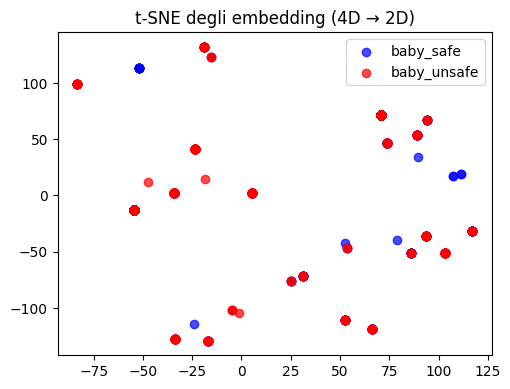

/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


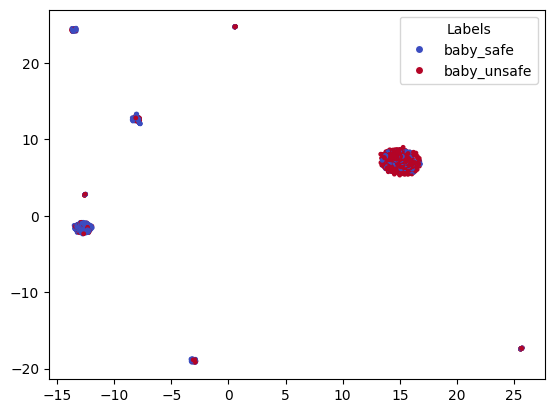

In [7]:
ret.report("minkowski")

## 4. Train model classification

------------------------------------------------------------------------------------------
--------------------------------------FIRST ANALYSIS--------------------------------------
------------------------------------------------------------------------------------------


/opt/anaconda3/envs/yolov8_env/lib/python3.10/multiprocessing/queues.py:122: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  return _ForkingPickler.loads(res)
/opt/anaconda3/envs/yolov8_env/lib/python3.10/multiprocessing/queues.py:122: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  return _ForkingPickler.loads(res)
/opt/anaconda3/envs/yolov8_env/lib/python3.10/multiprocessing/queues.py:122: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this pack

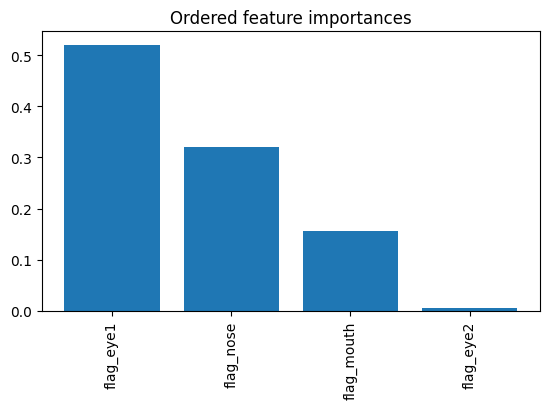

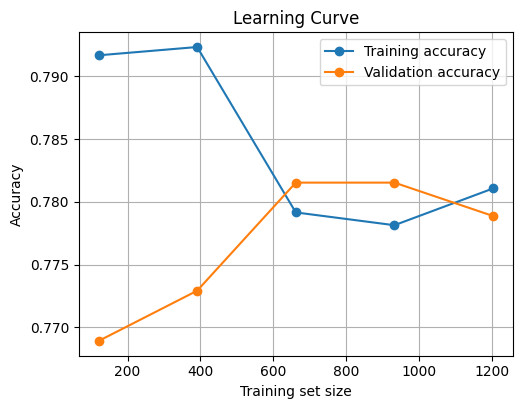


Dataset labels:----------------------------------------
{'baby_safe': 0, 'baby_unsafe': 1}

Report-------------------------------------------------
              precision    recall  f1-score   support

   baby_safe       0.74      0.77      0.75       115
 baby_unsafe       0.86      0.83      0.84       187

    accuracy                           0.81       302
   macro avg       0.80      0.80      0.80       302
weighted avg       0.81      0.81      0.81       302

Confusion matrix---------------------------------------


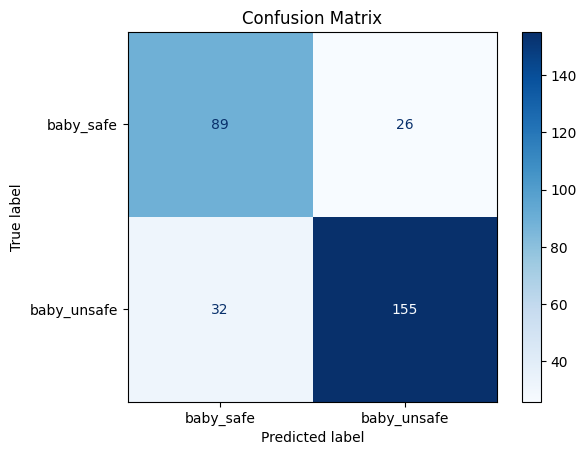

(RandomForestClassifier(max_depth=5, min_samples_leaf=10, min_samples_split=20,
                        n_estimators=300),
 {'all_features': {'model': RandomForestClassifier(max_depth=5, min_samples_leaf=10, min_samples_split=20,
                          n_estimators=300),
   'X': array([[0, 0, 0, 0],
          [1, 1, 1, 1],
          [0, 0, 0, 0],
          ...,
          [0, 0, 0, 0],
          [0, 0, 0, 0],
          [0, 0, 0, 0]]),
   'y': array([1, 1, 1, ..., 1, 0, 1])}})

In [8]:
clf = Classifier(embeddings, emb_builder.y, emb_builder.classes_bs)
clf.random_forest()

---
# EMBEDDING all features

---

## 2. Extract embeddings from dataset

**Create embeddings**

In [9]:
embeddings = emb_builder.create_embedding(flags=True,positions=True,geometric_info=True)


Embedding creation------------------------------------------------------------------------
Features: ['flag_eye1', 'flag_eye2', 'flag_nose', 'flag_mouth', 'x_eye1', 'y_eye1', 'x_eye2', 'y_eye2', 'x_nose', 'y_nose', 'x_mouth', 'y_mouth', 'eye_distance', 'eye_distance_norm', 'face_vertical_length', 'face_vertical_length_norm', 'face_angle_vertical', 'face_angle_horizontal', 'symmetry_diff', 'head_ration']
FINISHED: 1506 embedding created
------------------------------------------------------------------------------------------


In [10]:
embeddings.head()

,flag_eye1,flag_eye2,flag_nose,flag_mouth,x_eye1,y_eye1,x_eye2,y_eye2,x_nose,y_nose,x_mouth,y_mouth,eye_distance,eye_distance_norm,face_vertical_length,face_vertical_length_norm,face_angle_vertical,face_angle_horizontal,symmetry_diff,head_ration
0,0,0,0,0,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.000000,1.292278
1,1,1,1,1,0.747866,0.955937,0.746319,0.680452,0.709361,0.853581,0.650598,0.840860,0.275490,0.685025,0.060125,0.090708,122.830696,147.334481,0.085138,1.648186
2,0,0,0,0,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.000000,1.728926
3,1,1,1,1,0.533123,0.143157,0.374687,0.148591,0.457184,0.163462,0.469082,0.201713,0.158529,0.397289,0.040059,0.172300,87.692268,154.811363,0.004185,0.582652
4,1,1,1,1,0.859706,0.598094,0.846316,0.728694,0.827010,0.658031,0.788980,0.648129,0.131284,0.496643,0.039298,0.121073,104.018161,136.106213,0.002724,1.227875


## 3. Retrieval to evaluate embedding goodness

Precision at different k:-----------------------------------------------------------------


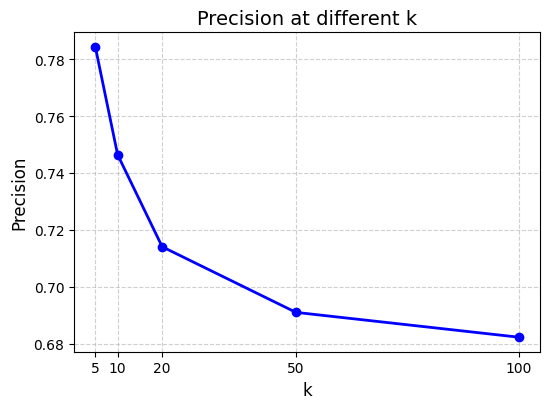


Recall at R-------------------------------------------------------------------------------
0.6081484296113405

Silhouette score--------------------------------------------------------------------------

Embeddings distributions------------------------------------------------------------------


/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/discriminant_analysis.py:756: RuntimeWarning: divide by zero encountered in matmul
  X_new = (X - self.xbar_) @ self.scalings_
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/discriminant_analysis.py:756: RuntimeWarning: overflow encountered in matmul
  X_new = (X - self.xbar_) @ self.scalings_
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/discriminant_analysis.py:756: RuntimeWarning: invalid value encountered in matmul
  X_new = (X - self.xbar_) @ self.scalings_


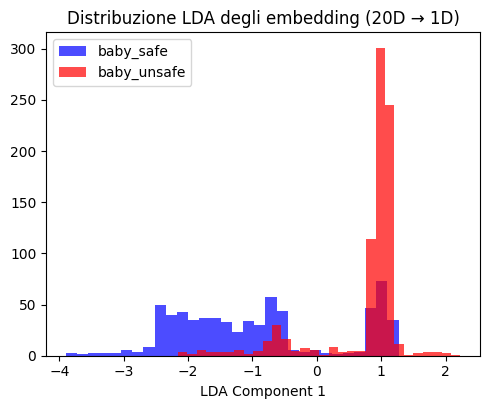

/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/utils/extmath.py:350: RuntimeWarning: divide by zero encountered in matmul
  Q, _ = normalizer(A @ Q)
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/utils/extmath.py:350: RuntimeWarning: overflow encountered in matmul
  Q, _ = normalizer(A @ Q)
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/utils/extmath.py:350: RuntimeWarning: invalid value encountered in matmul
  Q, _ = normalizer(A @ Q)
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/utils/extmath.py:351: RuntimeWarning: divide by zero encountered in matmul
  Q, _ = normalizer(A.T @ Q)
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/utils/extmath.py:351: RuntimeWarning: overflow encountered in matmul
  Q, _ = normalizer(A.T @ Q)
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/utils/extmath.py:351: RuntimeWarning: invalid value encountered in matmul
  Q, _ = normaliz

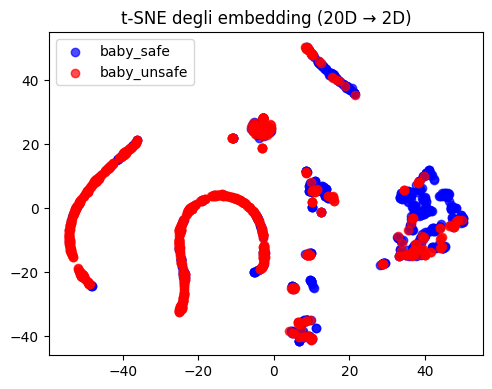

/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


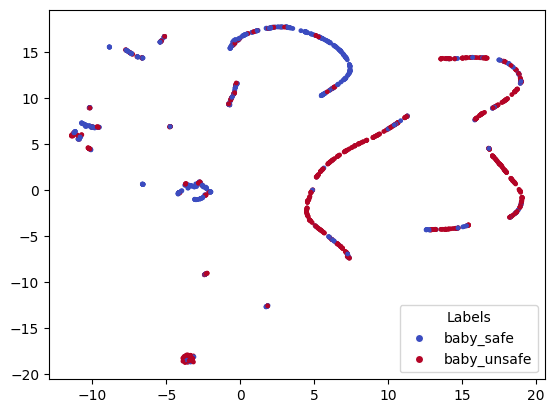

In [11]:
ret = ImageRetrieval( embeddings, emb_builder.y, emb_builder.image_paths, image_dataset_path, emb_builder.classes_bs)
ret.report("euclidean")

Precision at different k:-----------------------------------------------------------------


/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/util

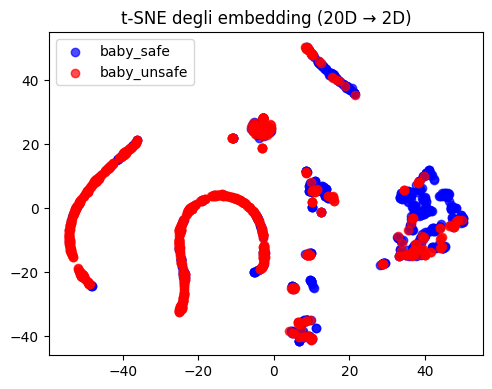

/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


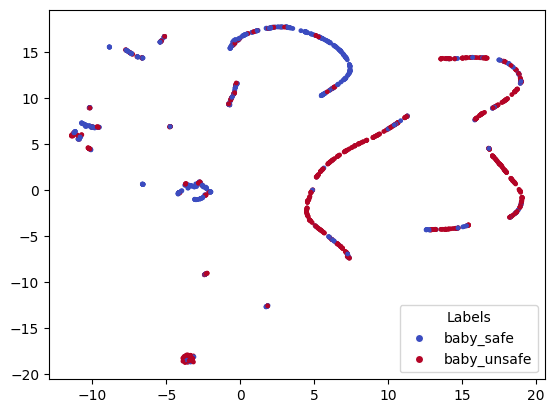

In [12]:
ret.report("cosine")

Precision at different k:-----------------------------------------------------------------


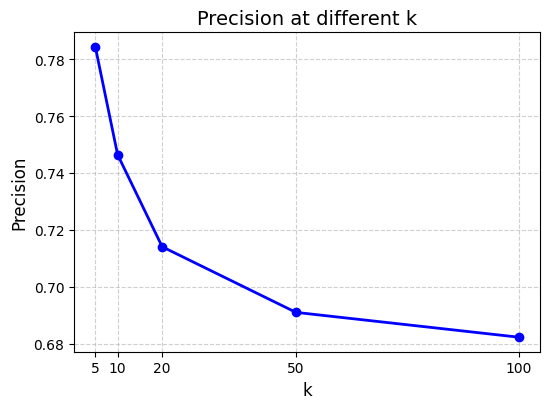


Recall at R-------------------------------------------------------------------------------
0.6081484296113405

Silhouette score--------------------------------------------------------------------------

Embeddings distributions------------------------------------------------------------------


/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/discriminant_analysis.py:756: RuntimeWarning: divide by zero encountered in matmul
  X_new = (X - self.xbar_) @ self.scalings_
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/discriminant_analysis.py:756: RuntimeWarning: overflow encountered in matmul
  X_new = (X - self.xbar_) @ self.scalings_
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/discriminant_analysis.py:756: RuntimeWarning: invalid value encountered in matmul
  X_new = (X - self.xbar_) @ self.scalings_


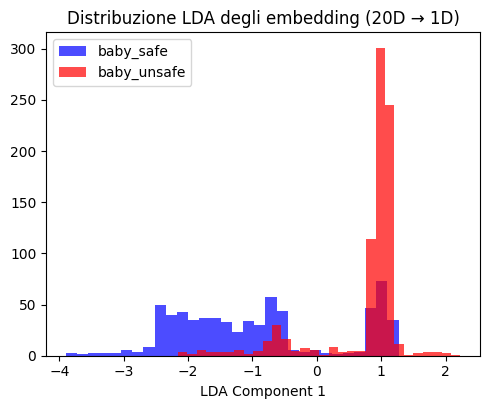

/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/utils/extmath.py:350: RuntimeWarning: divide by zero encountered in matmul
  Q, _ = normalizer(A @ Q)
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/utils/extmath.py:350: RuntimeWarning: overflow encountered in matmul
  Q, _ = normalizer(A @ Q)
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/utils/extmath.py:350: RuntimeWarning: invalid value encountered in matmul
  Q, _ = normalizer(A @ Q)
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/utils/extmath.py:351: RuntimeWarning: divide by zero encountered in matmul
  Q, _ = normalizer(A.T @ Q)
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/utils/extmath.py:351: RuntimeWarning: overflow encountered in matmul
  Q, _ = normalizer(A.T @ Q)
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/utils/extmath.py:351: RuntimeWarning: invalid value encountered in matmul
  Q, _ = normaliz

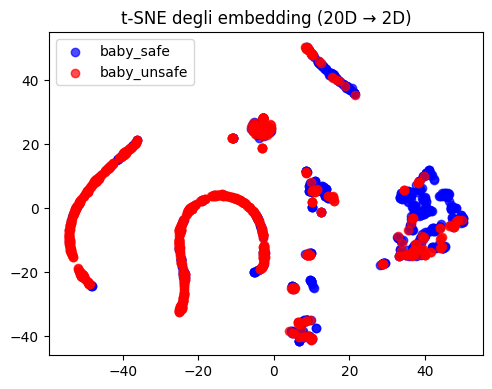

/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


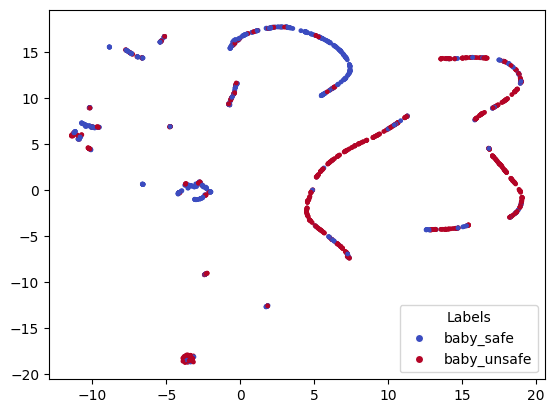

In [13]:
ret.report("minkowski")

## 4. Train model classification

------------------------------------------------------------------------------------------
--------------------------------------FIRST ANALYSIS--------------------------------------
------------------------------------------------------------------------------------------


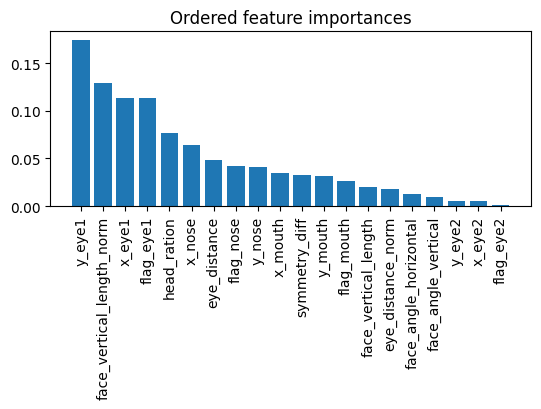

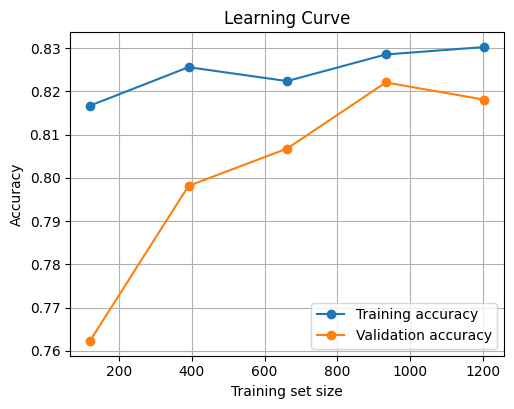


Dataset labels:----------------------------------------
{'baby_safe': 0, 'baby_unsafe': 1}

Report-------------------------------------------------
              precision    recall  f1-score   support

   baby_safe       0.82      0.77      0.79       115
 baby_unsafe       0.87      0.89      0.88       187

    accuracy                           0.85       302
   macro avg       0.84      0.83      0.84       302
weighted avg       0.85      0.85      0.85       302

Confusion matrix---------------------------------------


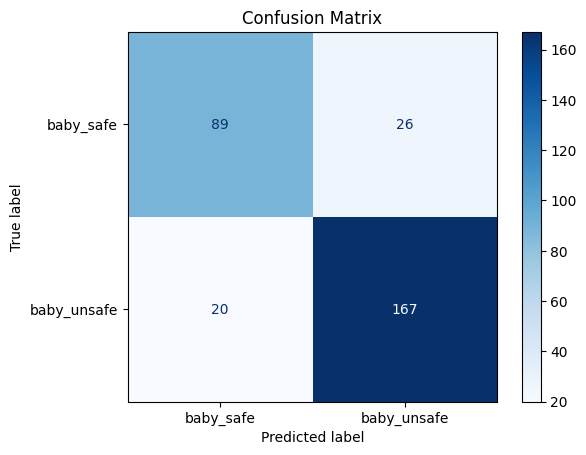

------------------------------------------------------------------------------------------
---------------------------------TOP 10 FEATURES ANALYSIS---------------------------------
------------------------------------------------------------------------------------------


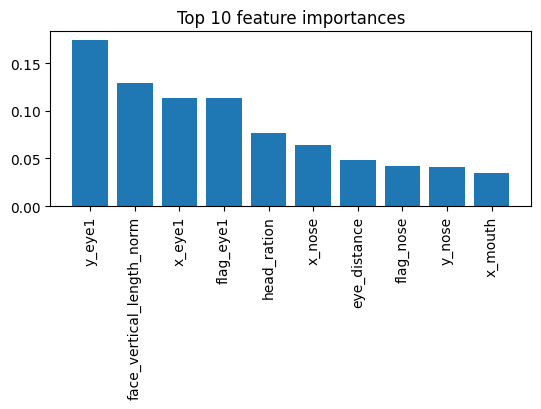

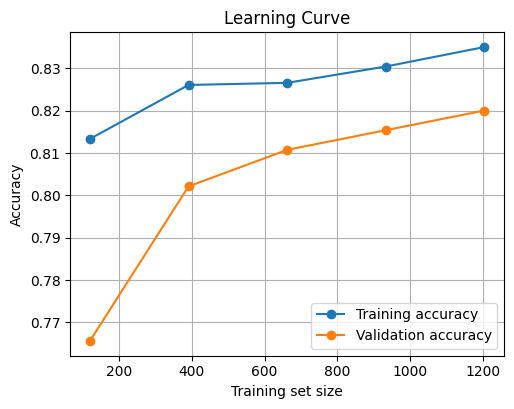


Dataset labels:----------------------------------------
{'baby_safe': 0, 'baby_unsafe': 1}

Report-------------------------------------------------
              precision    recall  f1-score   support

   baby_safe       0.83      0.76      0.79       115
 baby_unsafe       0.86      0.90      0.88       187

    accuracy                           0.85       302
   macro avg       0.84      0.83      0.84       302
weighted avg       0.85      0.85      0.85       302

Confusion matrix---------------------------------------


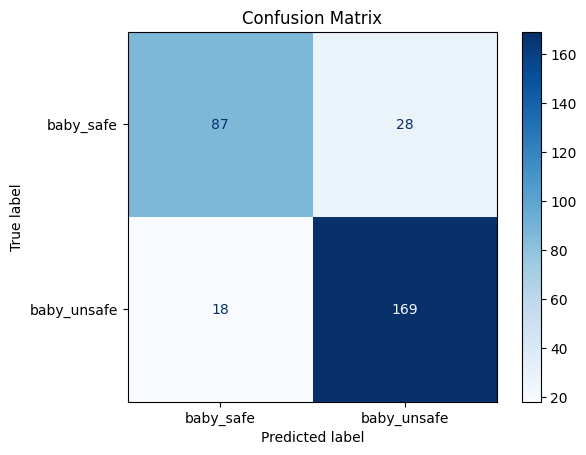

(RandomForestClassifier(max_depth=5, min_samples_leaf=10, min_samples_split=20,
                        n_estimators=300),
 {'all_features': {'model': RandomForestClassifier(max_depth=5, min_samples_leaf=10, min_samples_split=20,
                          n_estimators=300),
   'X': array([[          0,           0,           0, ...,          -1,           0,      1.2923],
          [          1,           1,           1, ...,      147.33,    0.085138,      1.6482],
          [          0,           0,           0, ...,          -1,           0,      1.7289],
          ...,
          [          0,           0,           0, ...,          -1,           0,      1.6419],
          [          0,           0,           0, ...,          -1,           0,      2.0943],
          [          0,           0,           0, ...,          -1,           0,     0.64309]]),
   'y': array([1, 1, 1, ..., 1, 0, 1])},
  'top_10_features': {'model': RandomForestClassifier(max_depth=5, min_samples_leaf=10, min_

In [14]:
clf = Classifier(embeddings, emb_builder.y, emb_builder.classes_bs)
clf.random_forest()

---
# EMBEDDING all features normalized

---

## 2. Extract embeddings from dataset

**Create embeddings**

In [15]:
embeddings = emb_builder.create_embedding(flags=True,positions=True,geometric_info=True,positions_normalized=True)


Embedding creation------------------------------------------------------------------------
Features: ['flag_eye1', 'flag_eye2', 'flag_nose', 'flag_mouth', 'x_eye1', 'y_eye1', 'x_eye2', 'y_eye2', 'x_nose', 'y_nose', 'x_mouth', 'y_mouth', 'x_eye1_norm', 'y_eye1_norm', 'x_eye2_norm', 'y_eye2_norm', 'x_nose_norm', 'y_nose_norm', 'x_mouth_norm', 'y_mouth_norm', 'eye_distance', 'eye_distance_norm', 'face_vertical_length', 'face_vertical_length_norm', 'face_angle_vertical', 'face_angle_horizontal', 'symmetry_diff', 'head_ration']
FINISHED: 1506 embedding created
------------------------------------------------------------------------------------------


In [16]:
embeddings.head()

,flag_eye1,flag_eye2,flag_nose,flag_mouth,x_eye1,y_eye1,x_eye2,y_eye2,x_nose,y_nose,...,x_mouth_norm,y_mouth_norm,eye_distance,eye_distance_norm,face_vertical_length,face_vertical_length_norm,face_angle_vertical,face_angle_horizontal,symmetry_diff,head_ration
0,0,0,0,0,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,-7.346064,-3.560087,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.000000,1.292278
1,1,1,1,1,0.747866,0.955937,0.746319,0.680452,0.709361,0.853581,...,0.814792,1.258686,0.275490,0.685025,0.060125,0.090708,122.830696,147.334481,0.085138,1.648186
2,0,0,0,0,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,-1.126908,-1.251334,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.000000,1.728926
3,1,1,1,1,0.533123,0.143157,0.374687,0.148591,0.457184,0.163462,...,1.014402,1.536646,0.158529,0.397289,0.040059,0.172300,87.692268,154.811363,0.004185,0.582652
4,1,1,1,1,0.859706,0.598094,0.846316,0.728694,0.827010,0.658031,...,0.911147,0.985550,0.131284,0.496643,0.039298,0.121073,104.018161,136.106213,0.002724,1.227875


## 3. Retrieval to evaluate embedding goodness

Precision at different k:-----------------------------------------------------------------


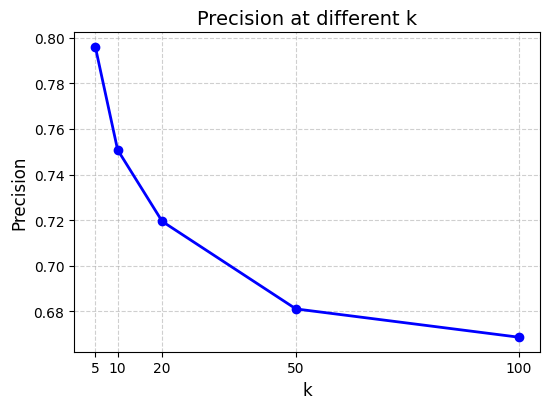


Recall at R-------------------------------------------------------------------------------
0.6024940168282802

Silhouette score--------------------------------------------------------------------------

Embeddings distributions------------------------------------------------------------------


/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/discriminant_analysis.py:756: RuntimeWarning: divide by zero encountered in matmul
  X_new = (X - self.xbar_) @ self.scalings_
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/discriminant_analysis.py:756: RuntimeWarning: overflow encountered in matmul
  X_new = (X - self.xbar_) @ self.scalings_
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/discriminant_analysis.py:756: RuntimeWarning: invalid value encountered in matmul
  X_new = (X - self.xbar_) @ self.scalings_


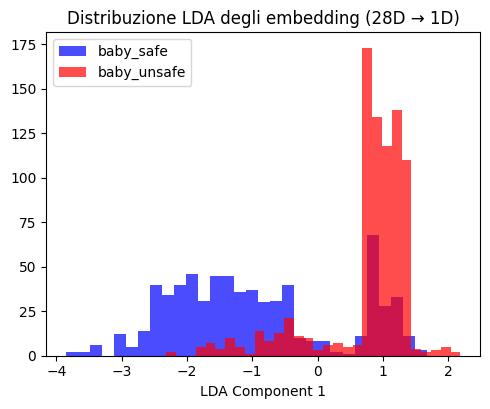

/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/utils/extmath.py:350: RuntimeWarning: divide by zero encountered in matmul
  Q, _ = normalizer(A @ Q)
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/utils/extmath.py:350: RuntimeWarning: overflow encountered in matmul
  Q, _ = normalizer(A @ Q)
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/utils/extmath.py:350: RuntimeWarning: invalid value encountered in matmul
  Q, _ = normalizer(A @ Q)
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/utils/extmath.py:351: RuntimeWarning: divide by zero encountered in matmul
  Q, _ = normalizer(A.T @ Q)
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/utils/extmath.py:351: RuntimeWarning: overflow encountered in matmul
  Q, _ = normalizer(A.T @ Q)
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/utils/extmath.py:351: RuntimeWarning: invalid value encountered in matmul
  Q, _ = normaliz

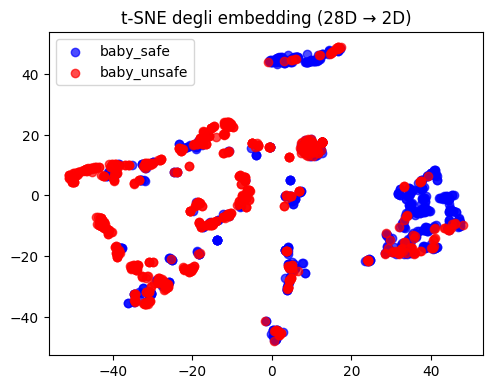

/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


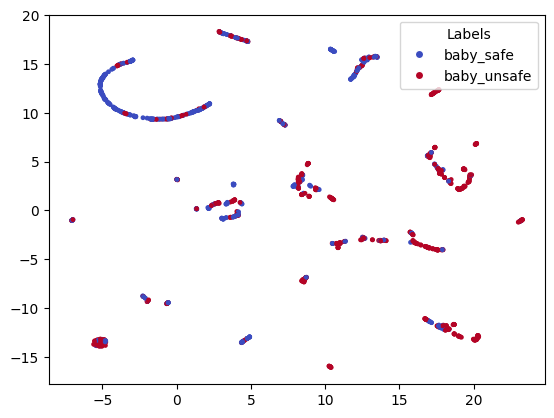

In [17]:
ret = ImageRetrieval( embeddings, emb_builder.y, emb_builder.image_paths, image_dataset_path, emb_builder.classes_bs)
ret.report("euclidean")

Precision at different k:-----------------------------------------------------------------


/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/util

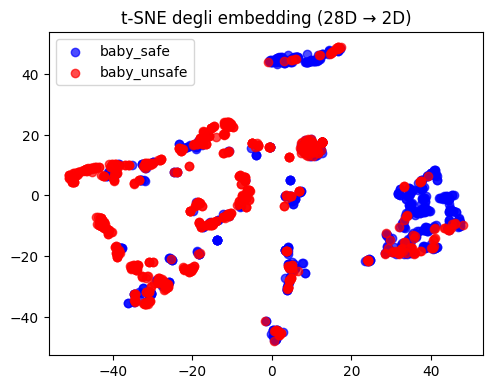

/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


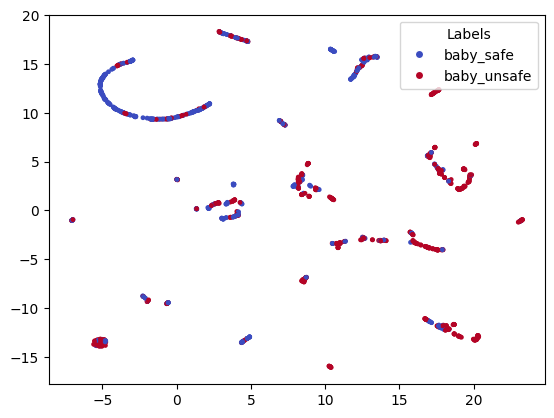

In [18]:
ret.report("cosine")

Precision at different k:-----------------------------------------------------------------


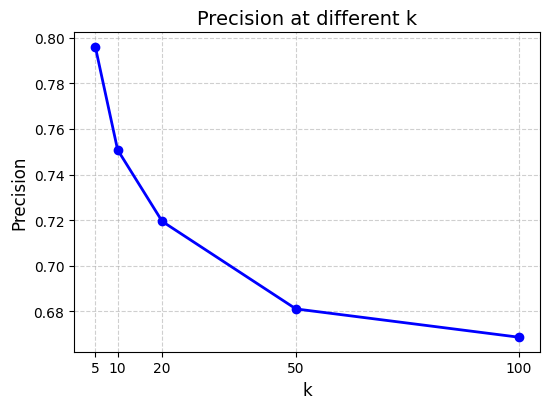


Recall at R-------------------------------------------------------------------------------
0.6024940168282802

Silhouette score--------------------------------------------------------------------------

Embeddings distributions------------------------------------------------------------------


/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/discriminant_analysis.py:756: RuntimeWarning: divide by zero encountered in matmul
  X_new = (X - self.xbar_) @ self.scalings_
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/discriminant_analysis.py:756: RuntimeWarning: overflow encountered in matmul
  X_new = (X - self.xbar_) @ self.scalings_
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/discriminant_analysis.py:756: RuntimeWarning: invalid value encountered in matmul
  X_new = (X - self.xbar_) @ self.scalings_


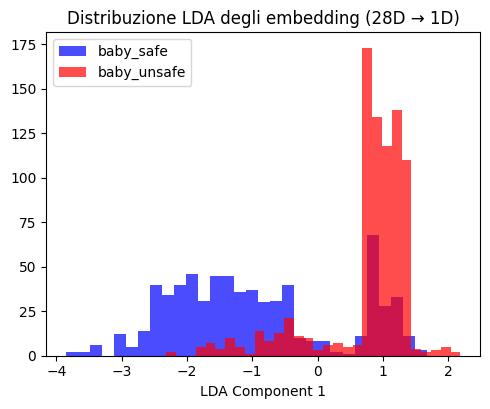

/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/utils/extmath.py:350: RuntimeWarning: divide by zero encountered in matmul
  Q, _ = normalizer(A @ Q)
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/utils/extmath.py:350: RuntimeWarning: overflow encountered in matmul
  Q, _ = normalizer(A @ Q)
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/utils/extmath.py:350: RuntimeWarning: invalid value encountered in matmul
  Q, _ = normalizer(A @ Q)
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/utils/extmath.py:351: RuntimeWarning: divide by zero encountered in matmul
  Q, _ = normalizer(A.T @ Q)
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/utils/extmath.py:351: RuntimeWarning: overflow encountered in matmul
  Q, _ = normalizer(A.T @ Q)
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/utils/extmath.py:351: RuntimeWarning: invalid value encountered in matmul
  Q, _ = normaliz

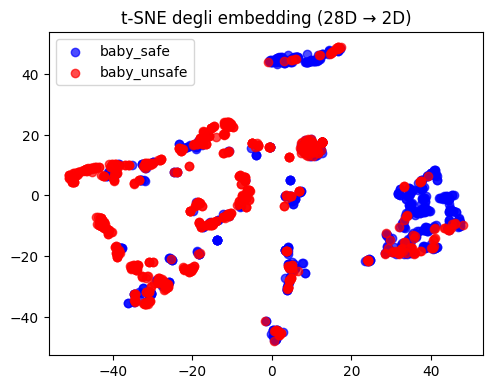

/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


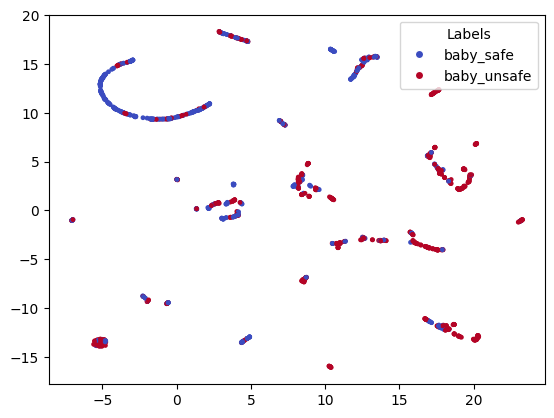

In [19]:
ret.report("minkowski")

## 4. Train model classification

------------------------------------------------------------------------------------------
--------------------------------------FIRST ANALYSIS--------------------------------------
------------------------------------------------------------------------------------------


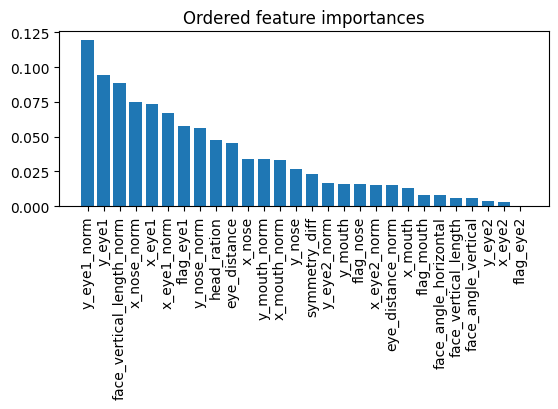

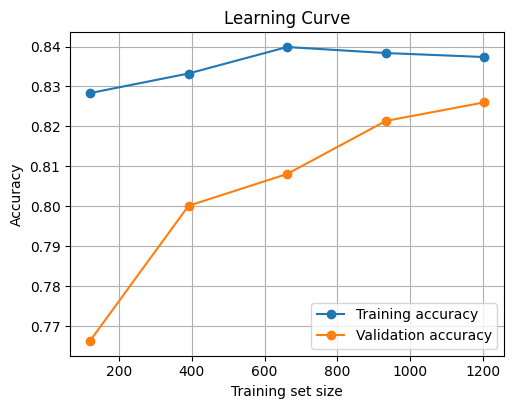


Dataset labels:----------------------------------------
{'baby_safe': 0, 'baby_unsafe': 1}

Report-------------------------------------------------
              precision    recall  f1-score   support

   baby_safe       0.79      0.77      0.78       115
 baby_unsafe       0.86      0.88      0.87       187

    accuracy                           0.83       302
   macro avg       0.83      0.82      0.82       302
weighted avg       0.83      0.83      0.83       302

Confusion matrix---------------------------------------


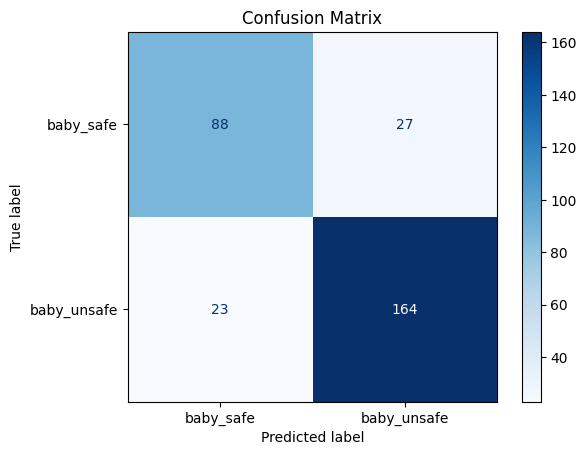

------------------------------------------------------------------------------------------
---------------------------------TOP 10 FEATURES ANALYSIS---------------------------------
------------------------------------------------------------------------------------------


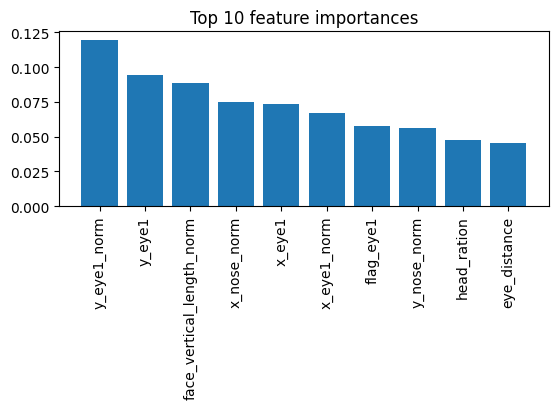

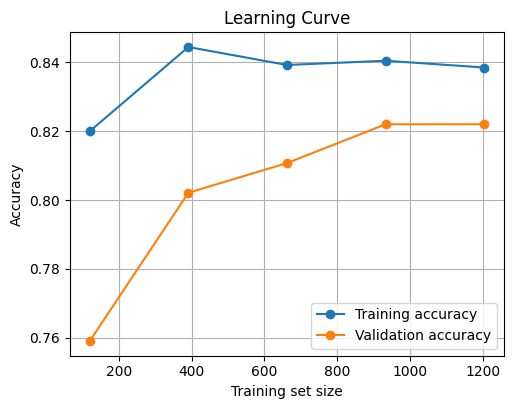


Dataset labels:----------------------------------------
{'baby_safe': 0, 'baby_unsafe': 1}

Report-------------------------------------------------
              precision    recall  f1-score   support

   baby_safe       0.84      0.76      0.79       115
 baby_unsafe       0.86      0.91      0.88       187

    accuracy                           0.85       302
   macro avg       0.85      0.83      0.84       302
weighted avg       0.85      0.85      0.85       302

Confusion matrix---------------------------------------


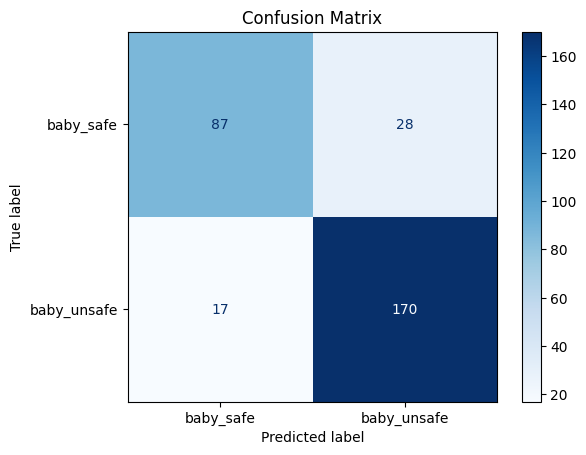

(RandomForestClassifier(max_depth=5, min_samples_leaf=10, min_samples_split=20,
                        n_estimators=300),
 {'all_features': {'model': RandomForestClassifier(max_depth=5, min_samples_leaf=10, min_samples_split=20,
                          n_estimators=300),
   'X': array([[          0,           0,           0, ...,          -1,           0,      1.2923],
          [          1,           1,           1, ...,      147.33,    0.085138,      1.6482],
          [          0,           0,           0, ...,          -1,           0,      1.7289],
          ...,
          [          0,           0,           0, ...,          -1,           0,      1.6419],
          [          0,           0,           0, ...,          -1,           0,      2.0943],
          [          0,           0,           0, ...,          -1,           0,     0.64309]]),
   'y': array([1, 1, 1, ..., 1, 0, 1])},
  'top_10_features': {'model': RandomForestClassifier(max_depth=5, min_samples_leaf=10, min_

In [20]:
clf = Classifier(embeddings, emb_builder.y, emb_builder.classes_bs)
clf.random_forest()

------------------------------------------------------------------------------------------
--------------------------------------FIRST ANALYSIS--------------------------------------
------------------------------------------------------------------------------------------


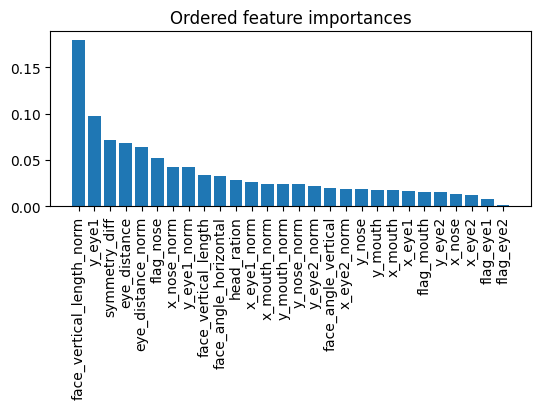

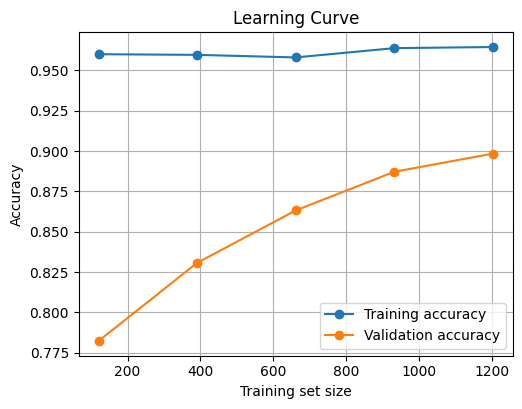


Dataset labels:----------------------------------------
{'baby_safe': 0, 'baby_unsafe': 1}

Report-------------------------------------------------
              precision    recall  f1-score   support

   baby_safe       0.93      0.84      0.89       115
 baby_unsafe       0.91      0.96      0.94       187

    accuracy                           0.92       302
   macro avg       0.92      0.90      0.91       302
weighted avg       0.92      0.92      0.92       302

Confusion matrix---------------------------------------


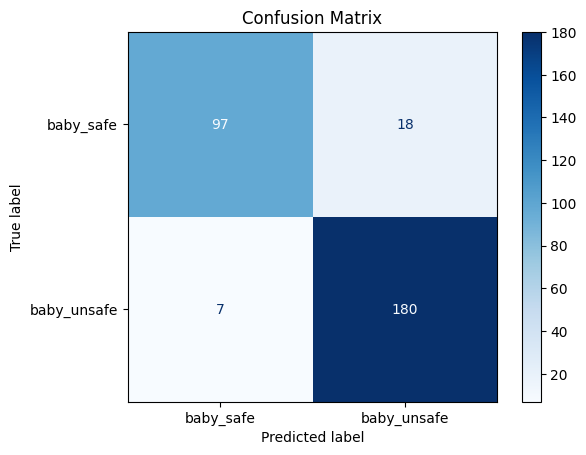

------------------------------------------------------------------------------------------
---------------------------------TOP 10 FEATURES ANALYSIS---------------------------------
------------------------------------------------------------------------------------------


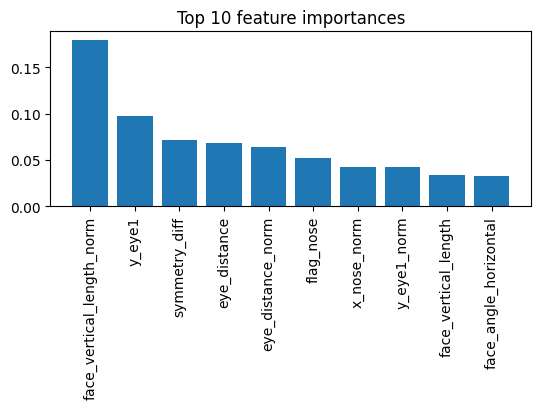

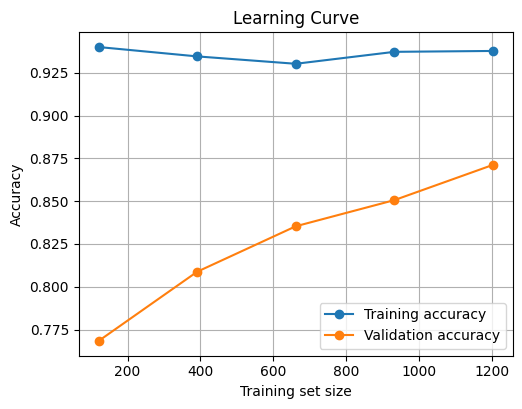


Dataset labels:----------------------------------------
{'baby_safe': 0, 'baby_unsafe': 1}

Report-------------------------------------------------
              precision    recall  f1-score   support

   baby_safe       0.86      0.83      0.84       115
 baby_unsafe       0.90      0.92      0.91       187

    accuracy                           0.88       302
   macro avg       0.88      0.87      0.88       302
weighted avg       0.88      0.88      0.88       302

Confusion matrix---------------------------------------


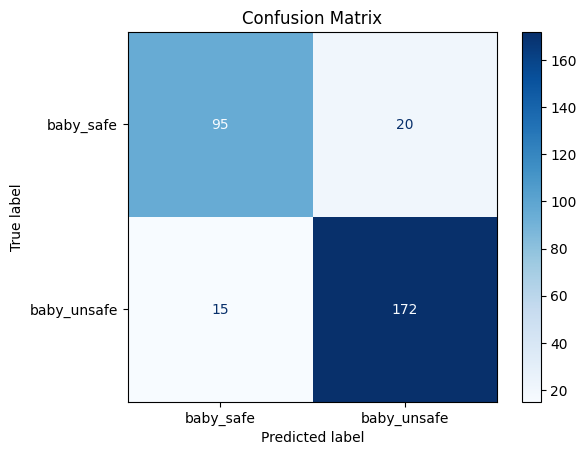

(XGBClassifier(base_score=None, booster=None, callbacks=None,
               colsample_bylevel=None, colsample_bynode=None,
               colsample_bytree=0.8, device=None, early_stopping_rounds=None,
               enable_categorical=False, eval_metric=None, feature_types=None,
               feature_weights=None, gamma=None, grow_policy=None,
               importance_type=None, interaction_constraints=None,
               learning_rate=0.05, max_bin=None, max_cat_threshold=None,
               max_cat_to_onehot=None, max_delta_step=None, max_depth=5,
               max_leaves=None, min_child_weight=None, missing=nan,
               monotone_constraints=None, multi_strategy=None, n_estimators=300,
               n_jobs=None, num_parallel_tree=None, ...),
 {'all_features': {'model': XGBClassifier(base_score=None, booster=None, callbacks=None,
                 colsample_bylevel=None, colsample_bynode=None,
                 colsample_bytree=0.8, device=None, early_stopping_rounds=None,

In [21]:
clf.XGBC()

------------------------------------------------------------------------------------------
--------------------------------------FIRST ANALYSIS--------------------------------------
------------------------------------------------------------------------------------------


/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/util

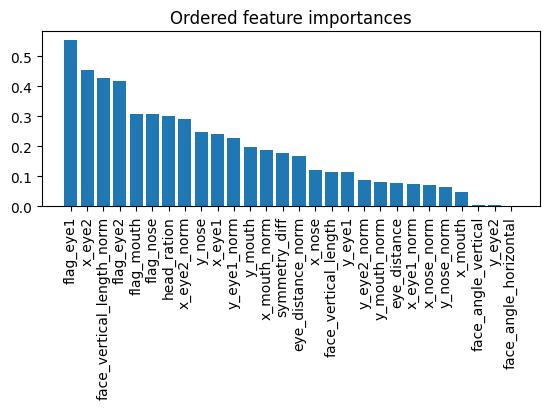

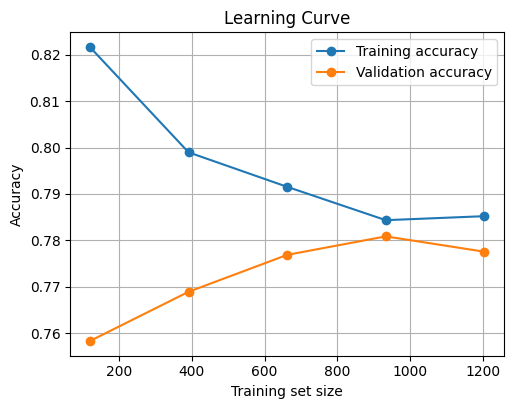


Dataset labels:----------------------------------------
{'baby_safe': 0, 'baby_unsafe': 1}

Report-------------------------------------------------
              precision    recall  f1-score   support

   baby_safe       0.76      0.76      0.76       115
 baby_unsafe       0.85      0.86      0.85       187

    accuracy                           0.82       302
   macro avg       0.81      0.81      0.81       302
weighted avg       0.82      0.82      0.82       302

Confusion matrix---------------------------------------


/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b


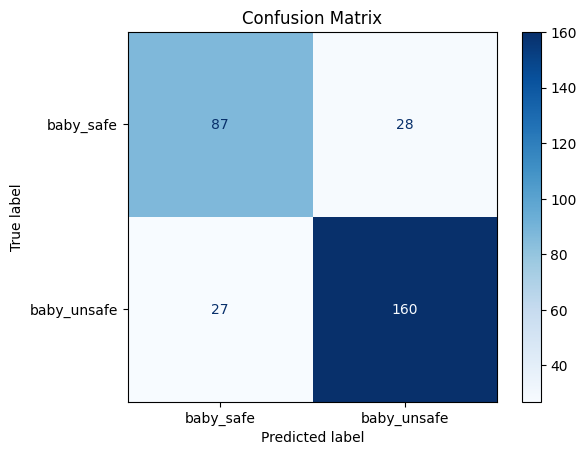

------------------------------------------------------------------------------------------
---------------------------------TOP 10 FEATURES ANALYSIS---------------------------------
------------------------------------------------------------------------------------------


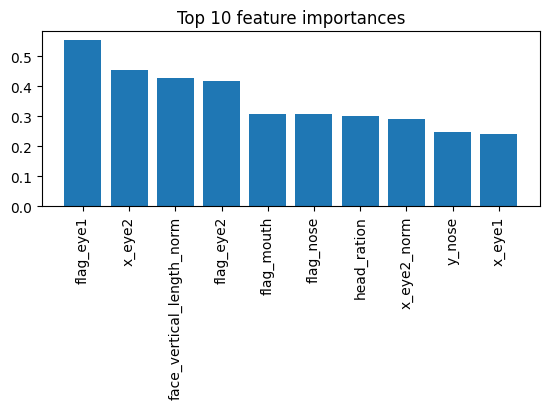

/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/util

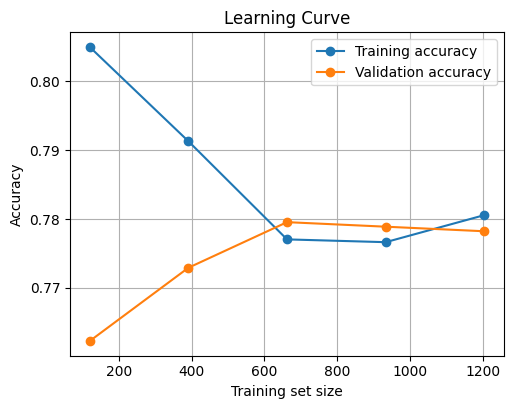


Dataset labels:----------------------------------------
{'baby_safe': 0, 'baby_unsafe': 1}

Report-------------------------------------------------
              precision    recall  f1-score   support

   baby_safe       0.76      0.75      0.75       115
 baby_unsafe       0.85      0.86      0.85       187

    accuracy                           0.81       302
   macro avg       0.80      0.80      0.80       302
weighted avg       0.81      0.81      0.81       302

Confusion matrix---------------------------------------


/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/opt/anaconda3/envs/yolov8_env/lib/python3.10/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b


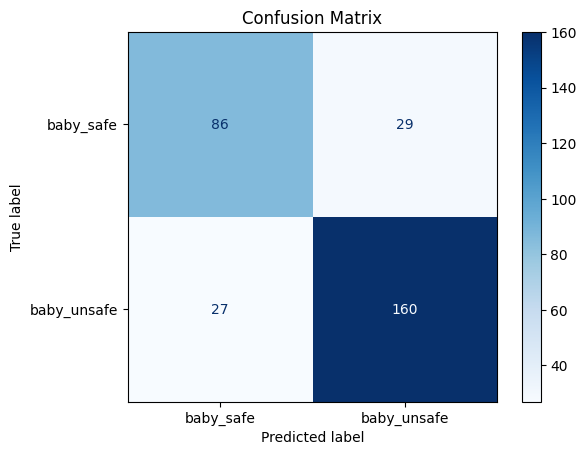

(LogisticRegression(C=0.1, solver='liblinear'),
 {'all_features': {'model': LogisticRegression(C=0.1, solver='liblinear'),
   'X': array([[          0,           0,           0, ...,          -1,           0,      1.2923],
          [          1,           1,           1, ...,      147.33,    0.085138,      1.6482],
          [          0,           0,           0, ...,          -1,           0,      1.7289],
          ...,
          [          0,           0,           0, ...,          -1,           0,      1.6419],
          [          0,           0,           0, ...,          -1,           0,      2.0943],
          [          0,           0,           0, ...,          -1,           0,     0.64309]]),
   'y': array([1, 1, 1, ..., 1, 0, 1])},
  'top_10_features': {'model': LogisticRegression(C=0.1, solver='liblinear'),
   'X': array([[          0,          -1,          -1, ...,     -7.3461,          -1,          -1],
          [          1,     0.74632,    0.090708, ...,     0.93467

In [22]:
clf.logistic_regression()

## Save notebook

In [23]:
save_as_pdf(ipynbname.path())

[NbConvertApp] Converting notebook /Users/lorenzodimaio/Download/SIDS_revelation_project/full_pipeline/pipeline_dataset_v2.ipynb to pdf
[NbConvertApp] Support files will be in /Users/lorenzodimaio/Download/SIDS_revelation_project/full_pipeline/reports/pipeline_dataset_v2(2025-09-01)_files/
[NbConvertApp] Writing 5841100 bytes to notebook.tex
[NbConvertApp] Building PDF
[NbConvertApp] Running xelatex 3 times: ['xelatex', 'notebook.tex', '-quiet']
[NbConvertApp] Running bibtex 1 time: ['bibtex', 'notebook']
[NbConvertApp] WARNING | bibtex had problems, most likely because there were no citations
[NbConvertApp] PDF successfully created
[NbConvertApp] Writing 2625493 bytes to /Users/lorenzodimaio/Download/SIDS_revelation_project/full_pipeline/reports/pipeline_dataset_v2(2025-09-01).pdf
